In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


In [2]:
def generate_linear_3class():
    np.random.seed(0)
    n = 500

    c1 = np.random.randn(n, 2) + np.array([0, 0])
    c2 = np.random.randn(n, 2) + np.array([5, 5])
    c3 = np.random.randn(n, 2) + np.array([0, 5])

    X = np.vstack((c1, c2, c3))
    y = np.array([0]*n + [1]*n + [2]*n)

    return X, y


In [3]:
def generate_nonlinear_3class():
    np.random.seed(1)
    n = 500
    X = []
    y = []

    for i in range(3):
        r = np.linspace(0.1, 1, n)
        t = np.linspace(i*4, (i+1)*4, n) + np.random.randn(n)*0.2
        X.append(np.c_[r*np.sin(t), r*np.cos(t)])
        y.append(np.full(n, i))

    return np.vstack(X), np.hstack(y)


In [4]:
def split_data(X, y):
    X_tr, y_tr, X_val, y_val, X_te, y_te = [], [], [], [], [], []

    for cls in np.unique(y):
        idx = np.where(y == cls)[0]
        np.random.shuffle(idx)

        n = len(idx)
        t = int(0.6 * n)
        v = int(0.2 * n)

        X_tr.append(X[idx[:t]])
        y_tr.append(y[idx[:t]])
        X_val.append(X[idx[t:t+v]])
        y_val.append(y[idx[t:t+v]])
        X_te.append(X[idx[t+v:]])
        y_te.append(y[idx[t+v:]])

    return (np.vstack(X_tr), np.hstack(y_tr),
            np.vstack(X_val), np.hstack(y_val),
            np.vstack(X_te), np.hstack(y_te))


In [5]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def sigmoid_derivative(z):
    s = sigmoid(z)
    return s * (1 - s)


In [6]:
def one_hot(y, c):
    Y = np.zeros((len(y), c))
    for i in range(len(y)):
        Y[i, y[i]] = 1
    return Y


In [7]:
class FCNN:
    def __init__(self, layers, lr=0.05):
        self.lr = lr
        self.W = []
        self.b = []

        for i in range(len(layers)-1):
            self.W.append(np.random.randn(layers[i], layers[i+1]) * 0.1)
            self.b.append(np.zeros((1, layers[i+1])))

    def forward(self, X):
        self.A = [X]
        self.Z = []

        for i in range(len(self.W)):
            z = self.A[-1] @ self.W[i] + self.b[i]
            a = sigmoid(z)
            self.Z.append(z)
            self.A.append(a)

        return self.A[-1]

    def backward(self, X, Y):
        m = X.shape[0]
        deltas = [None]*len(self.W)

        deltas[-1] = (self.A[-1] - Y) * sigmoid_derivative(self.Z[-1])

        for i in reversed(range(len(self.W)-1)):
            deltas[i] = (deltas[i+1] @ self.W[i+1].T) * sigmoid_derivative(self.Z[i])

        for i in range(len(self.W)):
            self.W[i] -= self.lr * self.A[i].T @ deltas[i] / m
            self.b[i] -= self.lr * np.mean(deltas[i], axis=0)

    def train(self, X, Y, epochs):
        errors = []
        for _ in range(epochs):
            out = self.forward(X)
            errors.append(np.mean((Y - out)**2))
            self.backward(X, Y)
        return errors

    def predict(self, X):
        return np.argmax(self.forward(X), axis=1)


In [8]:
def confusion_matrix(y, yp, c):
    cm = np.zeros((c, c), int)
    for i in range(len(y)):
        cm[y[i], yp[i]] += 1
    return cm

def accuracy(y, yp):
    return np.mean(y == yp)


In [9]:
def plot_decision_region(model, X, y, title):
    x1_min, x1_max = X[:,0].min()-1, X[:,0].max()+1
    x2_min, x2_max = X[:,1].min()-1, X[:,1].max()+1

    xx, yy = np.meshgrid(np.linspace(x1_min, x1_max, 300),
                         np.linspace(x2_min, x2_max, 300))
    grid = np.c_[xx.ravel(), yy.ravel()]
    pred = model.predict(grid).reshape(xx.shape)

    plt.contourf(xx, yy, pred, alpha=0.3)
    plt.scatter(X[:,0], X[:,1], c=y, edgecolor='k')
    plt.title(title)
    plt.show()


In [10]:
def plot_node_outputs(model, X, title):
    model.forward(X)

    for l in range(1, len(model.A)):
        for n in range(model.A[l].shape[1]):
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter(X[:,0], X[:,1], model.A[l][:,n],
                       c=model.A[l][:,n])
            ax.set_title(f"{title} Layer {l} Node {n}")
            ax.set_xlabel("x1")
            ax.set_ylabel("x2")
            ax.set_zlabel("Output")
            plt.show()


In [11]:
class SingleNeuron:
    def __init__(self, lr=0.05):
        self.w = np.random.randn(2)
        self.b = 0
        self.lr = lr

    def train(self, X, y, epochs):
        for _ in range(epochs):
            for i in range(len(X)):
                z = np.dot(X[i], self.w) + self.b
                y_hat = sigmoid(z)
                error = y_hat - y[i]
                self.w -= self.lr * error * X[i]
                self.b -= self.lr * error

    def predict(self, X):
        return (sigmoid(X @ self.w + self.b) > 0.5).astype(int)


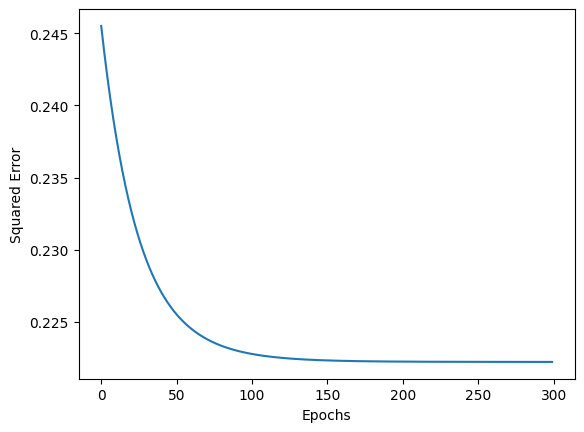

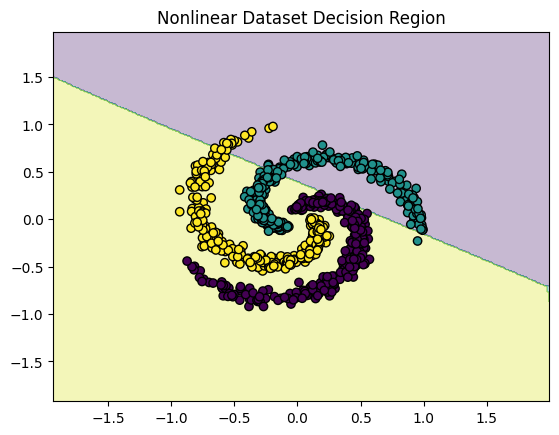

Validation CM:
 [[ 1  0 99]
 [44  0 56]
 [ 2  0 98]]
Validation Accuracy: 0.33
Test CM:
 [[  0   0 100]
 [ 47   0  53]
 [  8   0  92]]
Test Accuracy: 0.30666666666666664


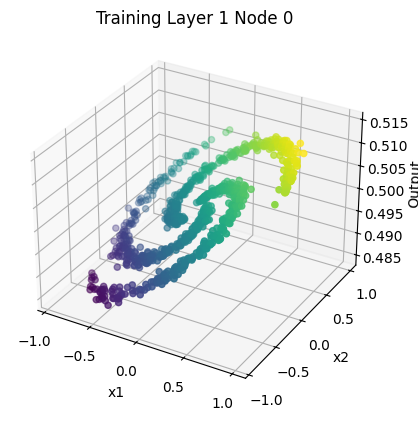

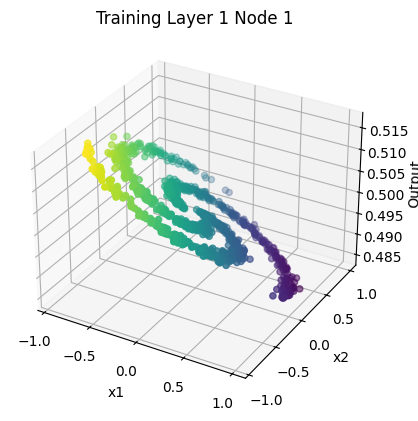

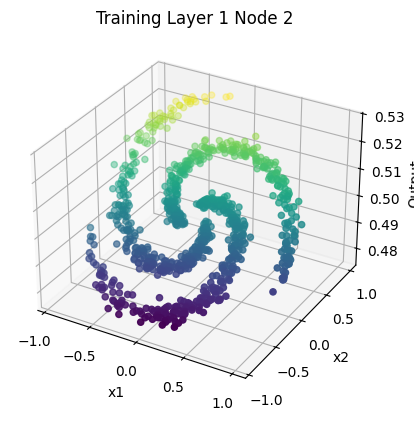

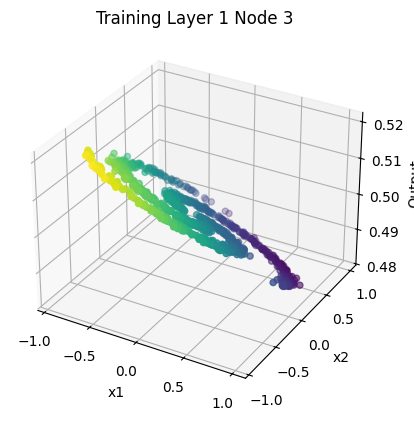

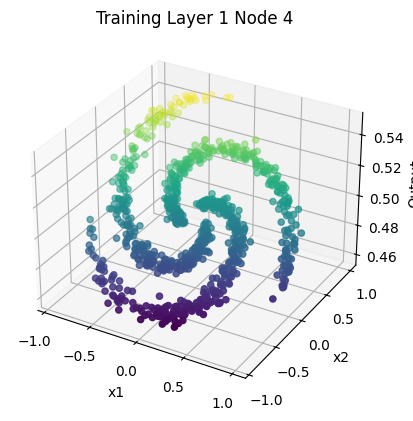

...

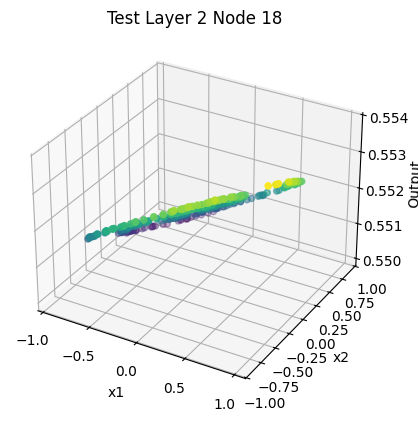

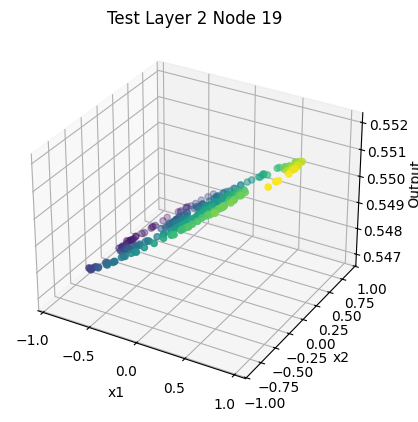

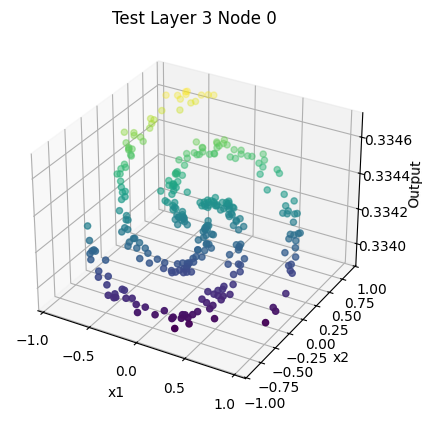

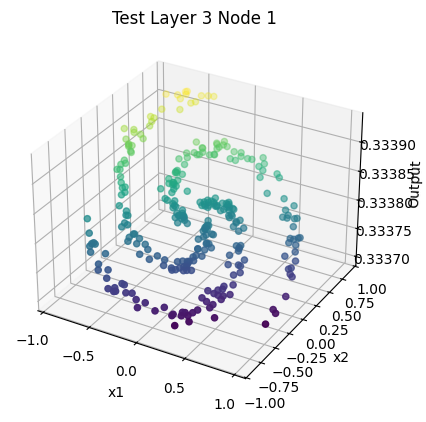

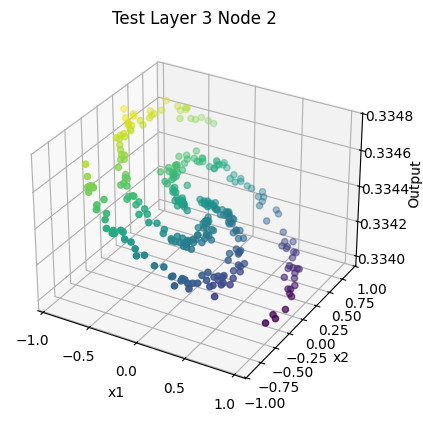

In [12]:
X1, y1 = generate_linear_3class()
X2, y2 = generate_nonlinear_3class()

X1_tr, y1_tr, X1_val, y1_val, X1_te, y1_te = split_data(X1, y1)
X2_tr, y2_tr, X2_val, y2_val, X2_te, y2_te = split_data(X2, y2)

model1 = FCNN([2, 10, 3])
err1 = model1.train(X1_tr, one_hot(y1_tr, 3), 200)

model2 = FCNN([2, 20, 20, 3])
err2 = model2.train(X2_tr, one_hot(y2_tr, 3), 300)

plt.plot(err2)
plt.xlabel("Epochs")
plt.ylabel("Squared Error")
plt.show()

plot_decision_region(model2, X2_tr, y2_tr, "Nonlinear Dataset Decision Region")

yp = model2.predict(X2_val)
print("Validation CM:\n", confusion_matrix(y2_val, yp, 3))
print("Validation Accuracy:", accuracy(y2_val, yp))

yp_test = model2.predict(X2_te)
print("Test CM:\n", confusion_matrix(y2_te, yp_test, 3))
print("Test Accuracy:", accuracy(y2_te, yp_test))

plot_node_outputs(model2, X2_tr, "Training")
plot_node_outputs(model2, X2_val, "Validation")
plot_node_outputs(model2, X2_te, "Test")
